<a id="contents_tabel"></a>    
<div style="border-radius:10px; padding: 15px; background-color: lavender; font-size:130%; text-align:left">

  <h1 align="left" style="color: royalblue;">Mục Lục:</h1>

  <ul>
    <li><a href="#Initialization">Bước 1 | Cài đặt và Khởi tạo</a></li>
    <li><a href="#Dataset_Analysis">Bước 2 | Phân tích Tập Dữ liệu</a></li>
    <li>
      <a href="#Dataset_Preparation">Bước 3 | Chuẩn bị Tập Dữ liệu</a>
      <ul>
        <li><a href="#Centralize_Dataset">Bước 3.1 | Tập trung thông tin về Dữ liệu</a></li>
        <li><a href="#Splitting_Dataset">Bước 3.2 | Chia tập dữ liệu theo tỷ lệ: Huấn luyện & Kiểm định</a></li>
        <li><a href="#Data_Augmentation">Bước 3.3 | Tăng cường và Chuẩn hóa Dữ liệu</a></li>
        <li><a href="#Generate_Batch">Bước 3.4 | Tạo Lô Hình Ảnh (Batches)</a></li>
      </ul>
    </li>
    <li><a href="#Dataset_Imbalances">Bước 4 | Xử lý Mất Cân Bằng Dữ liệu</a></li>
    <li>
      <a href="#Resnet50">Bước 5 | Xây dựng ResNet50 từ đầu</a>
      <ul>
        <li><a href="#Define_Scratch">Bước 5.1 | Định nghĩa Kiến trúc ResNet50 từ đầu</a></li>
        <li><a href="#Train_Scratch">Bước 5.2 | Huấn luyện Mô hình ResNet50 đã định nghĩa</a></li>
        <li><a href="#Eval_Scratch">Bước 5.3 | Đánh giá Mô hình ResNet50 đã định nghĩa</a></li>
      </ul>
    </li>
    <li>
      <a href="#Transfer_Learning">Bước 6 | ResNet50 với Học Chuyển Giao (Transfer Learning)</a>
      <ul>
        <li><a href="#Define_tf">Bước 6.1 | Tải ResNet50 với trọng số đã được huấn luyện</a></li>
        <li><a href="#Preprocess_tf">Bước 6.2 | Tiền xử lý ảnh theo yêu cầu của ResNet50</a></li>
        <li><a href="#Train_tf">Bước 6.3 | Tinh chỉnh mô hình học chuyển giao ResNet50</a></li>
        <li><a href="#Eval_tf">Bước 6.4 | Đánh giá mô hình học chuyển giao ResNet50</a></li>
      </ul>
    </li>
  </ul>
</div>


<a id="Initialization"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 1</p>
⬆️ [Tabel of Contents](#contents_tabel)

In [1]:
%pip install tensorflow

Note: you may need to restart the kernel to use updated packages.


In [32]:
import warnings
warnings.filterwarnings('ignore')

import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Activation, Add, Dense, Conv2D, GlobalAveragePooling2D, MaxPooling2D
from keras.layers import BatchNormalization, Dropout
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras.models import Model
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix

<a id="Dataset_Analysis"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 2</p>
⬆️ [Tabel of Contents](#contents_tabel)

In [33]:
# Define the path where our dataset is stored
dataset_path = 'TrashType_Image_Dataset'

# Retrieve the names of all folders (representing trash types) within the dataset directory
garbage_types = os.listdir(dataset_path)

# Set to store unique image dimensions for the entire dataset
all_dimensions_set = set()

# Iterate over each trash type (folder) to process images
for garbage_type in garbage_types:
    folder_path = os.path.join(dataset_path, garbage_type)
    
    # Verify that the current item is a directory
    if os.path.isdir(folder_path):
        image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg'))]
        
        # Display the count of images in the current folder
        num_images = len(image_files)
        print(f"{garbage_type} folder contains {num_images} images.")
        
        # Loop over each image to check its dimensions
        for image_file in image_files:
            image_path = os.path.join(folder_path, image_file)
            with Image.open(image_path) as img:
                # Extract the width, height, and channels (color depth) of the image and add to the dimensions set
                width, height = img.size
                channels = len(img.getbands())
                all_dimensions_set.add((width, height, channels))
                
# Determine if all images in the entore dataset have the same dimensions 
if len(all_dimensions_set) == 1: 
    width, height, channel = all_dimensions_set.pop()
    print(f"\nAll images in the dataset have the same dimensions: {width}x{height} with {channels} color channels.")
else:
    print("\nThe images in the dataset have different dimensions or color channels.")

paper folder contains 594 images.
green-glass folder contains 629 images.
clothes folder contains 5325 images.
metal folder contains 410 images.
cardboard folder contains 403 images.
trash folder contains 137 images.
glass folder contains 501 images.
biological folder contains 985 images.
white-glass folder contains 775 images.
battery folder contains 945 images.
brown-glass folder contains 607 images.
plastic folder contains 482 images.
shoes folder contains 1977 images.

The images in the dataset have different dimensions or color channels.


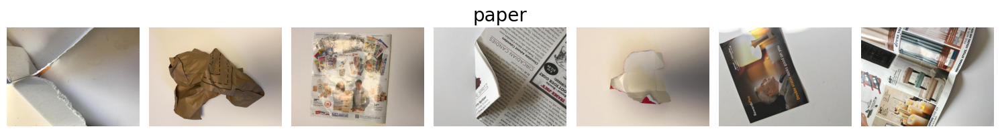

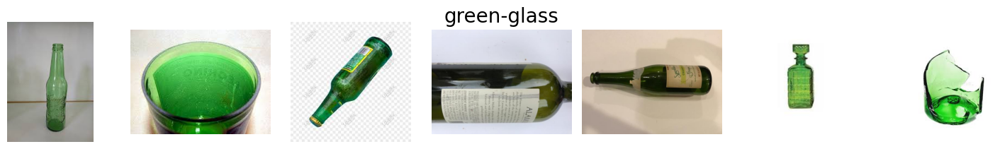

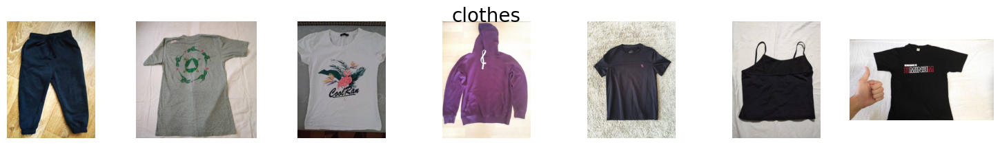

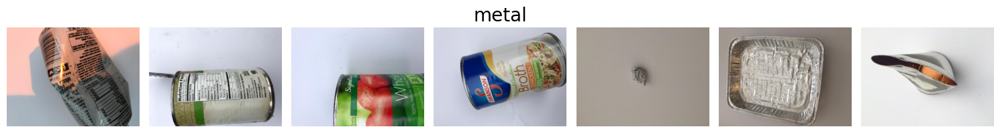

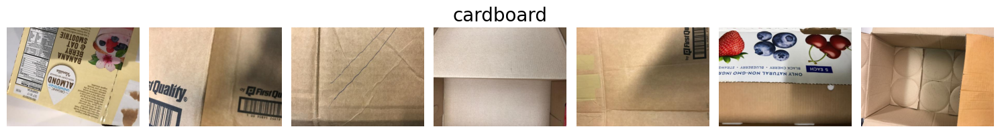

...

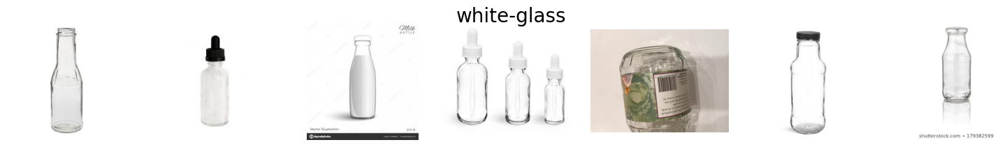

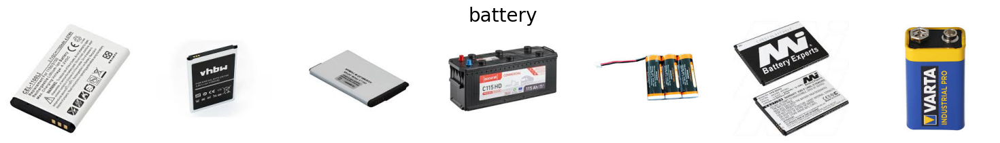

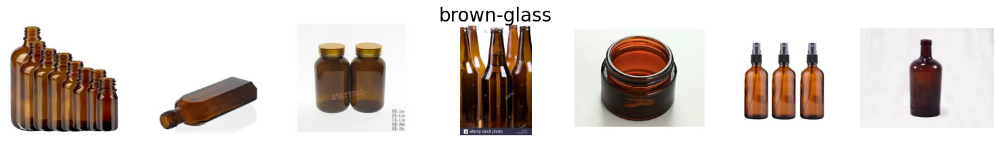

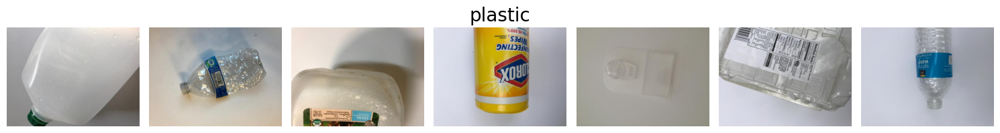

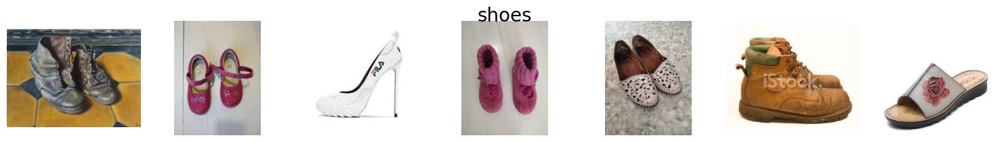

In [34]:
# Iterate over each trash type (folder) to display images
for garbage_type in garbage_types:
    folder_path = os.path.join(dataset_path, garbage_type)
    
    # Verify that the current item is a directory
    if os.path.isdir(folder_path):
        image_files = [f for f in os.listdir(folder_path) if f.endswith(('jpg', 'jpeg'))]
        
        # Select the first 10 images
        image_files = image_files[:7]
        
        # Set up subplots
        fig, axs = plt.subplots(1, 7, figsize=(15, 2))
        
        for i, image_file in enumerate(image_files):
            image_path = os.path.join(folder_path, image_file)
            with Image.open(image_path) as img:
                axs[i].imshow(img)
                axs[i].axis('off')
        
        plt.tight_layout()
        fig.suptitle(garbage_type, fontsize=20, y=1.03)
        plt.show()

<a id="Dataset_Preparation"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 3</p>
⬆️ [Tabel of Contents](#contents_tabel)

<a id="Centralize_Dataset"></a>
# <b><span style='color:darkturquoise'>Bước 3.1 | Tập trung thông tin về Dữ liệu</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [35]:
# Initialize an empty list to store image file paths and their respective labels
import pandas as pd

data = []

# Loop through each garbage type and collect its images' file paths
# Loop through each garbage type and collect its images' file paths
for garbage_type in garbage_types:
    folder_path = os.path.join(dataset_path, garbage_type)
    
    # Bỏ qua nếu không phải là thư mục (ví dụ: .DS_Store hoặc file lẻ)
    if not os.path.isdir(folder_path):
        continue

    for file in os.listdir(folder_path):
        data.append((os.path.join(folder_path, file), garbage_type))


# Convert the collected data into a DataFrame
df = pd.DataFrame(data, columns=['filepath', 'label'])

# Display the first few entries of the DataFrame
df.head()

,filepath,label
0,TrashType_Image_Dataset/paper/paper_098.jpg,paper
1,TrashType_Image_Dataset/paper/paper_067.jpg,paper
2,TrashType_Image_Dataset/paper/paper_073.jpg,paper
3,TrashType_Image_Dataset/paper/paper_259.jpg,paper
4,TrashType_Image_Dataset/paper/paper_265.jpg,paper


<a id="Splitting_Dataset"></a>
# <b><span style='color:darkturquoise'>Bước 3.2 | Chia tập dữ liệu theo tỷ lệ: Huấn luyện & Kiểm định</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [36]:
# Split with stratification
train_df, val_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['label'])

# Print the number of images in each set
print(f"Number of images in the training set: {len(train_df)}")
print(f"Number of images in the validation set: {len(val_df)}")

Number of images in the training set: 11016
Number of images in the validation set: 2754


In [37]:
# 1. Class distribution in the entire dataset
overall_distribution = df['label'].value_counts(normalize=True) * 100

# 2. Class distribution in the training set
train_distribution = train_df['label'].value_counts(normalize=True) * 100

# 3. Class distribution in the validation set
val_distribution = val_df['label'].value_counts(normalize=True) * 100

print("Class distribution in the entire dataset:\n")
print(overall_distribution.round(2))
print('-'*40)

print("\nClass distribution in the training set:\n")
print(train_distribution.round(2))
print('-'*40)

print("\nClass distribution in the validation set:\n")
print(val_distribution.round(2))

Class distribution in the entire dataset:

label
clothes        38.67
shoes          14.36
biological      7.15
battery         6.86
white-glass     5.63
green-glass     4.57
brown-glass     4.41
paper           4.31
glass           3.64
plastic         3.50
metal           2.98
cardboard       2.93
trash           0.99
Name: proportion, dtype: float64
----------------------------------------

Class distribution in the training set:

label
clothes        38.67
shoes          14.36
biological      7.15
battery         6.86
white-glass     5.63
green-glass     4.57
brown-glass     4.40
paper           4.31
glass           3.64
plastic         3.50
metal           2.98
cardboard       2.92
trash           1.00
Name: proportion, dtype: float64
----------------------------------------

Class distribution in the validation set:

label
clothes        38.67
shoes          14.34
biological      7.15
battery         6.86
white-glass     5.63
green-glass     4.58
brown-glass     4.43
paper       

<a id="Data_Augmentation"></a>
# <b><span style='color:darkturquoise'>Bước 3.3 | Tăng cường và Chuẩn hóa Dữ liệu</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [16]:
# Slight Augmentation settings for training
train_datagen = ImageDataGenerator(
    rescale=1./255,                     # Normalize pixel values to [0,1]
    rotation_range=45,                  # Randomly rotate the images by up to 45 degrees
    width_shift_range=0.15,             # Randomly shift images horizontally by up to 15% of the width
    height_shift_range=0.15,            # Randomly shift images vertically by up to 15% of the height
    zoom_range=0.15,                    # Randomly zoom in or out by up to 15%
    horizontal_flip=True,               # Randomly flip images horizontally
    vertical_flip=True,                 # Randomly flip images vertically
    shear_range=0.05,                   # Apply slight shear transformations
    brightness_range=[0.9, 1.1],        # Vary brightness between 90% to 110% of original
    channel_shift_range=10,             # Randomly shift channels (can change colors of images slightly but less aggressively)
    fill_mode='nearest'                 # Fill in missing pixels using the nearest filled value
)

# Only rescaling for validation
val_datagen = ImageDataGenerator(rescale=1./255)

<a id="Generate_Batch"></a>
# <b><span style='color:darkturquoise'>Bước 3.4 | Tạo Lô Hình Ảnh (Batches)</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [ ]:
# Using flow_from_dataframe to generate batches
# Generate training batches from the training dataframe
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,                  # DataFrame containing training data
    x_col="filepath",                    # Column with paths to image files
    y_col="label",                       # Column with image labels
    target_size=(224, 224),              # Resize all images to size of 384x384
    batch_size=32,                       # Number of images per batch
    class_mode='categorical',            # One-hot encode labels
    seed=42,                             # Seed for random number generator to ensure reproducibility
    shuffle=False                        # Data is not shuffled; order retained from DataFrame
)


# Generate validation batches from the validation dataframe
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,                    # DataFrame containing validation data
    x_col="filepath",                    # Column with paths to image files
    y_col="label",                       # Column with image labels
    target_size=(224, 224),              # Resize all images to size of 384x384
    batch_size=32,                       # Number of images per batch
    class_mode='categorical',            # One-hot encode labels
    seed=42,                             # Seed for random number generator to ensure reproducibility
    shuffle=False                        # Data is not shuffled; order retained from DataFrame
)

Found 11016 validated image filenames belonging to 13 classes.
Found 2754 validated image filenames belonging to 13 classes.


In [18]:
print(f"Number of batches in train_generator: {len(train_generator)}")
print(f"Number of batches in val_generator: {len(val_generator)}")

Number of batches in train_generator: 345
Number of batches in val_generator: 87


<a id="Dataset_Imbalances"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 4 | Xử lý Mất Cân Bằng Dữ liệu</p>
⬆️ [Tabel of Contents](#contents_tabel)

In [19]:
# Extract class labels from the 'label' column of train_df
class_labels = train_df['label'].unique()
class_labels

array(['biological', 'green-glass', 'cardboard', 'white-glass', 'shoes',
       'metal', 'plastic', 'clothes', 'glass', 'battery', 'paper',
       'brown-glass', 'trash'], dtype=object)

In [ ]:
train_generator.class_indices #Đây là chia batch ko phải bị 0

{'battery': 0,
 'biological': 1,
 'brown-glass': 2,
 'cardboard': 3,
 'clothes': 4,
 'glass': 5,
 'green-glass': 6,
 'metal': 7,
 'paper': 8,
 'plastic': 9,
 'shoes': 10,
 'trash': 11,
 'white-glass': 12}

In [21]:
# Compute class weights
weights = compute_class_weight(class_weight='balanced', classes=class_labels, y=train_df['label'])
weights

array([1.07536119, 1.68466126, 2.63162924, 1.36674938, 0.53564135,
       2.58348968, 2.19529693, 0.19891658, 2.11317859, 1.12087912,
       1.78396761, 1.74718477, 7.7034965 ])

In [22]:
# Convert the computed weights to a dictionary for passing to model training
class_weights = dict(zip(train_generator.class_indices.values(), weights))
class_weights

{0: 1.075361187036314,
 1: 1.6846612631900901,
 2: 2.6316292403248926,
 3: 1.3667493796526056,
 4: 0.5356413498006418,
 5: 2.5834896810506565,
 6: 2.1952969310482264,
 7: 0.19891657638136512,
 8: 2.1131785919815846,
 9: 1.120879120879121,
 10: 1.7839676113360323,
 11: 1.7471847739888977,
 12: 7.7034965034965035}

<a id="Resnet50"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 5 | Xây dựng ResNet50 từ đầu</p>
⬆️ [Tabel of Contents](#contents_tabel)

<a id="Define_Scratch"></a>
# <b><span style='color:darkturquoise'>Bước 5.1 | Định nghĩa Kiến trúc ResNet50 từ đầu</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

<img src="https://github.com/FarzadNekouee/Garbage_Classification_ResNet50_Scratch_to_Transfer-Learning/blob/master/images/Residual_Block.png?raw=true" width="2400">

In [23]:
def residual_block(X, kernel_size, filters, reduce=False, stride=2):
    """
    Implement a residual block for ResNet architectures.
    
    Arguments:
    X           -- input tensor of shape (m, height, width, channels)
    kernel_size -- integer, kernel size of the middle convolutional layer in the main path
    filters     -- python list of integers, defining the number of filters in the CONV layers of the main path
    reduce      -- boolean, whether to reduce the spatial dimensions and increase depth; 
                    if True, applies 1x1 CONV layer to the shortcut path.
    stride      -- integer, strides for the convolutional layer
    
    Returns:
    X           -- output of the identity block, tensor of shape (height, width, channels)
    """
    
    # Retrieve Filters
    F1, F2, F3 = filters
    
    # Save the input value. We will need this later to add back to the main path. 
    X_shortcut = X
    
    if reduce:
        # if we are to reduce the spatial size, apply a 1x1 CONV layer to the shortcut path
        X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (stride,stride), padding = 'valid', kernel_initializer='he_normal')(X)
        X = BatchNormalization(axis = 3)(X)
        X = Activation('relu')(X)
        
        X_shortcut = Conv2D(filters = F3, kernel_size = (1, 1), strides = (stride,stride), padding = 'valid', kernel_initializer='he_normal')(X_shortcut)
        X_shortcut = BatchNormalization(axis = 3)(X_shortcut)
    else: 
        # First component of main path
        X = Conv2D(filters = F1, kernel_size = (1, 1), strides = (1,1), padding = 'valid', kernel_initializer='he_normal')(X)
        X = BatchNormalization(axis = 3)(X)
        X = Activation('relu')(X)
    
    # Second component of main path
    X = Conv2D(filters = F2, kernel_size = (kernel_size, kernel_size), strides = (1,1), padding = 'same', kernel_initializer='he_normal')(X)
    X = BatchNormalization(axis = 3)(X)
    X = Activation('relu')(X)

    # Third component of main path
    X = Conv2D(filters = F3, kernel_size = (1, 1), strides = (1,1), padding = 'valid', kernel_initializer='he_normal')(X)
    X = BatchNormalization(axis = 3)(X)

    # Final step: Add shortcut value to main path, and pass it through a ReLU activation 
    X = Add()([X, X_shortcut])
    X = Activation('relu')(X)
    
    return X

In [24]:
def ResNet_50(input_shape, classes):
    """
    Arguments:
    input_shape -- tuple shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """

    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Block 1
    X = Conv2D(64, (7, 7), strides=(2, 2), kernel_initializer='he_normal')(X_input)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Block 2
    X = residual_block(X, 3, [64, 64, 256], reduce=True, stride=1)
    X = residual_block(X, 3, [64, 64, 256])
    X = residual_block(X, 3, [64, 64, 256])

    # Block 3 
    X = residual_block(X, 3, [128, 128, 512], reduce=True, stride=2)
    X = residual_block(X, 3, [128, 128, 512])
    X = residual_block(X, 3, [128, 128, 512])
    X = residual_block(X, 3, [128, 128, 512])

    # Block 4 
    X = residual_block(X, 3, [256, 256, 1024], reduce=True, stride=2)
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])

    # Block 5 
    X = residual_block(X, 3, [512, 512, 2048], reduce=True, stride=2)
    X = residual_block(X, 3, [512, 512, 2048])
    X = residual_block(X, 3, [512, 512, 2048])

    # Global Average Pooling to reduce spatial dimensions
    X = GlobalAveragePooling2D()(X)
    
    # Fully Connected Layer for classification
    X = Dense(classes, activation='softmax')(X)
        
    # Create the model
    model = Model(inputs = X_input, outputs = X, name='ResNet50')

    return model

In [25]:
def Modified_ResNet50(input_shape, classes):
    """
    Arguments:
    input_shape -- tuple shape of the images of the dataset
    classes -- integer, number of classes

    Returns:
    model -- a Model() instance in Keras
    """

    # Define the input as a tensor with shape input_shape
    X_input = Input(input_shape)

    # Stage 1
    X = Conv2D(64, (7, 7), strides=(2, 2), kernel_initializer='he_normal')(X_input)
    X = BatchNormalization(axis=3)(X)
    X = Activation('relu')(X)
    X = MaxPooling2D((3, 3), strides=(2, 2))(X)

    # Stage 2
    X = residual_block(X, 3, [64, 64, 256], reduce=True, stride=1)
    X = residual_block(X, 3, [64, 64, 256])
    X = residual_block(X, 3, [64, 64, 256])

    # Stage 3 
    X = residual_block(X, 3, [128, 128, 512], reduce=True, stride=2)
    X = residual_block(X, 3, [128, 128, 512])
    X = residual_block(X, 3, [128, 128, 512])
    X = residual_block(X, 3, [128, 128, 512])

    # Stage 4 
    X = residual_block(X, 3, [256, 256, 1024], reduce=True, stride=2)
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])
    X = residual_block(X, 3, [256, 256, 1024])

    # Stage 5 
    X = residual_block(X, 3, [512, 512, 2048], reduce=True, stride=2)
    X = residual_block(X, 3, [512, 512, 2048])
    X = residual_block(X, 3, [512, 512, 2048])

    # Global Average Pooling to reduce spatial dimensions
    X = GlobalAveragePooling2D()(X)
    
    # Add Dropout to prevent overfitting
    X = Dropout(0.5)(X)
    
    # Fully Connected Layer for classification
    X = Dense(classes, activation='softmax')(X)
        
    # Create the model
    model = Model(inputs = X_input, outputs = X, name='Modified_ResNet50')

    return model

In [38]:
# Define the shape of the input images and number of classes
input_shape = (224, 224, 3)
num_classes = 13

# Initialize the modified ResNet50 model with the specified parameters
modified_resnet50_model = Modified_ResNet50(input_shape=input_shape, classes=num_classes)

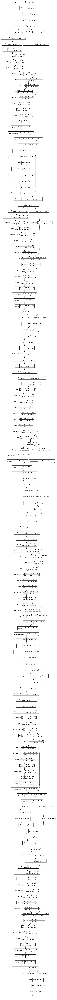

In [18]:
plot_model(modified_resnet50_model, show_shapes=True, show_layer_names=False, dpi=120)

In [39]:
modified_resnet50_model.summary()

Model: "Modified_ResNet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_53 (Conv2D)  │ (None, 109, 109,  │      9,472 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        256 │ conv2d_53[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_49       │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 54, 54,    │          0 │ activation_49[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 54, 54,    │      4,160 │ max_pooling2d_1[… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        256 │ conv2d_54[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_50       │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 54, 54,    │     36,928 │ activation_50[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        256 │ conv2d_56[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_51       │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 54, 54,    │     16,640 │ activation_51[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 54, 54,    │     16,640 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │      1,024 │ conv2d_57[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │      1,024 │ conv2d_55[0][0]   │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_16 (Add)        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│                     │ 256)              │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_52       │ (None, 54, 54,    │          0 │ add_16[0][0]    

 Total params: 23,614,349 (90.08 MB)

 Trainable params: 23,561,229 (89.88 MB)

 Non-trainable params: 53,120 (207.50 KB)

<a id="Train_Scratch"></a>
# <b><span style='color:darkturquoise'>Bước 5.2 | Huấn luyện Mô hình ResNet50 đã định nghĩa</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [40]:
modified_resnet50_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [29]:
# Add ReduceLROnPlateau callback
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=15, min_lr=0.00001)

# Add EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=50, restore_best_weights=True, verbose=1)

In [30]:
print(f"Number of batches in train_generator: {len(train_generator)}")
print(f"Number of batches in val_generator: {len(val_generator)}")

Number of batches in train_generator: 345
Number of batches in val_generator: 87


In [41]:
print("Assigned Class Weights:")
class_weights

Assigned Class Weights:


{0: 1.075361187036314,
 1: 1.6846612631900901,
 2: 2.6316292403248926,
 3: 1.3667493796526056,
 4: 0.5356413498006418,
 5: 2.5834896810506565,
 6: 2.1952969310482264,
 7: 0.19891657638136512,
 8: 2.1131785919815846,
 9: 1.120879120879121,
 10: 1.7839676113360323,
 11: 1.7471847739888977,
 12: 7.7034965034965035}

In [ ]:
# Total number of epochs
num_epochs = 200

# Train the model
history = modified_resnet50_model.fit(train_generator, 
                                      steps_per_epoch=len(train_generator), 
                                      epochs=num_epochs, 
                                      validation_data=val_generator, 
                                      validation_steps=len(val_generator),
                                      class_weight=class_weights,
                                      callbacks=[reduce_lr, early_stopping])

Epoch 1/200
64/64 [==============================] - 145s 1s/step - loss: 1.9813 - accuracy: 0.4003 - val_loss: 11397.1689 - val_accuracy: 0.1601 - lr: 0.0010
Epoch 2/200
64/64 [==============================] - 94s 1s/step - loss: 1.6961 - accuracy: 0.4419 - val_loss: 52.1083 - val_accuracy: 0.1957 - lr: 0.0010
Epoch 3/200
64/64 [==============================] - 97s 2s/step - loss: 1.6854 - accuracy: 0.4463 - val_loss: 503.9613 - val_accuracy: 0.2352 - lr: 0.0010
Epoch 4/200
64/64 [==============================] - 96s 1s/step - loss: 1.5226 - accuracy: 0.4715 - val_loss: 223.6734 - val_accuracy: 0.2787 - lr: 0.0010
Epoch 5/200
64/64 [==============================] - 96s 1s/step - loss: 1.3602 - accuracy: 0.5072 - val_loss: 2.1725 - val_accuracy: 0.3419 - lr: 0.0010
Epoch 6/200
64/64 [==============================] - 96s 1s/step - loss: 1.3581 - accuracy: 0.4953 - val_loss: 1.4960 - val_accuracy: 0.4190 - lr: 0.0010
Epoch 7/200
64/64 [==============================] - 94s 1s/step -

<a id="Eval_Scratch"></a>
# <b><span style='color:darkturquoise'>Bước 5.3 | Đánh giá Mô hình ResNet50 đã định nghĩa</span></b>
⬆️ [Tabel of Contents](#contents_tabel)


<a id="curves_scratch"></a>
## <b><span style='color:darkturquoise'>Bước 5.3.1 |</span><span style='color:royalblue'> Visualizing</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [51]:
def plot_learning_curves(history, start_epoch=5):
    """
    Plot training and validation loss and accuracy curves.

    Parameters:
    - history: Training history (output from the model's fit method).
    - start_epoch: Epoch from which to start plotting. Default is 5 (i.e., plot from epoch 6 onwards).
    """

    # Convert the history.history dict to a pandas DataFrame
    df = pd.DataFrame(history.history)

    # Plot the curves from the specified epoch onwards
    df = df.iloc[start_epoch-1:]

    # Set the style of seaborn for better visualization
    sns.set(rc={'axes.facecolor': '#f0f0fc'}, style='darkgrid')

    # Plotting the learning curves
    plt.figure(figsize=(15,6))

    # Plotting the training and validation loss
    plt.subplot(1, 2, 1)
    sns.lineplot(x=df.index, y=df['loss'], color='royalblue', label='Train Loss')
    sns.lineplot(x=df.index, y=df['val_loss'], color='orangered', linestyle='--', label='Validation Loss')
    plt.title('Loss Evolution')

    # Plotting the training and validation accuracy
    plt.subplot(1, 2, 2)
    sns.lineplot(x=df.index, y=df['accuracy'], color='royalblue', label='Train Accuracy')
    sns.lineplot(x=df.index, y=df['val_accuracy'], color='orangered', linestyle='--', label='Validation Accuracy')
    plt.title('Accuracy Evolution')

    plt.show()

In [52]:
plot_learning_curves(history)

NameError: name 'history' is not defined

In [ ]:
def evaluate_model_performance(model, val_generator, class_labels):
    """
    Evaluate the model's performance on the validation set and print the classification report.

    Parameters:
    - model: The trained model.
    - val_generator: Validation data generator.
    - class_labels: List of class names.
    
    Returns:
    - report: Classification report as a string.
    """
    
    # Getting all the true labels for the validation set
    true_labels = val_generator.classes

    # Get the class labels (names) from the generator
    class_labels = list(val_generator.class_indices.keys())

    # To get the predicted labels, we predict using the model  
    predictions = model.predict(val_generator, steps=len(val_generator))
    
    # Take the argmax to get the predicted class indices.
    predicted_labels = np.argmax(predictions, axis=1)
    
    # Extracting true labels from the validation generator
    true_labels = val_generator.classes

    # Classification report
    report = classification_report(true_labels, predicted_labels, target_names=class_labels)
    print(report)
    print('\n')
    
    # Define a custom colormap
    colors = ["white", "royalblue"]
    cmap_cm = LinearSegmentedColormap.from_list("cmap_cm", colors)

    # Confusion Matrix
    cm = confusion_matrix(true_labels, predicted_labels)

    # Plotting confusion matrix using seaborn
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, cmap=cmap_cm, fmt='d', xticklabels=class_labels, yticklabels=class_labels)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

evaluate_model_performance(modified_resnet50_model, val_generator, class_labels)


<a id="Transfer_Learning"></a>
# <p style="background-color: royalblue; font-family:calibri; color:white; font-size:140%; font-family:Verdana; text-align:center; border-radius:15px 50px;">Bước 6 | ResNet50 với Học Chuyển Giao (Transfer Learning)</p>
⬆️ [Tabel of Contents](#contents_tabel)

<a id="Define_tf"></a>
# <b><span style='color:darkturquoise'> 6.1 |</span><span style='color:royalblue'> Loading ResNet50 with Pre-trained Weights</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [42]:
# Load the ResNet50 model with weights pre-trained on ImageNet
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [43]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [44]:
len(base_model.layers) 

175

In [45]:
for i, layer in enumerate(base_model.layers):
    if 140 <= i <= 150:
        print(i, layer.name)

140 conv4_block6_3_bn
141 conv4_block6_add
142 conv4_block6_out
143 conv5_block1_1_conv
144 conv5_block1_1_bn
145 conv5_block1_1_relu
146 conv5_block1_2_conv
147 conv5_block1_2_bn
148 conv5_block1_2_relu
149 conv5_block1_0_conv
150 conv5_block1_3_conv


In [46]:
# Freeze the layers up to conv4_block6_out
for layer in base_model.layers[:143]: # include the layer 142
    layer.trainable = False

In [47]:
# Create the new model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(6, activation='softmax')(x)

transfer_resnet50_model = Model(inputs=base_model.input, outputs=x)

# Compile the model
transfer_resnet50_model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

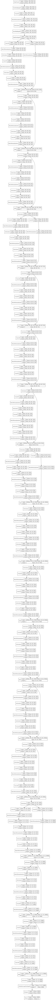

In [35]:
plot_model(transfer_resnet50_model, show_shapes=True, show_layer_names=False, dpi=120)

In [48]:
transfer_resnet50_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,600,006 (90.03 MB)

 Trainable params: 14,988,294 (57.18 MB)

 Non-trainable params: 8,611,712 (32.85 MB)

<a id="Preprocess_tf"></a>
# <b><span style='color:darkturquoise'> 6.2 |</span><span style='color:royalblue'> Applying ResNet50-specific Image Preprocessing </span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [49]:
# Slight Augmentation settings for training
train_datagen = ImageDataGenerator(
    rotation_range=60,                  # Randomly rotate the images by up to 60 degrees
    width_shift_range=0.15,             # Randomly shift images horizontally by up to 15% of the width
    height_shift_range=0.15,            # Randomly shift images vertically by up to 15% of the height
    zoom_range=0.20,                    # Randomly zoom in or out by up to 20%
    horizontal_flip=True,               # Randomly flip images horizontally
    vertical_flip=True,                 # Randomly flip images vertically
    shear_range=0.05,                   # Apply slight shear transformations
    brightness_range=[0.9, 1.1],        # Vary brightness between 90% to 110% of original
    channel_shift_range=10,             # Randomly shift channels (can change colors of images slightly but less aggressively)
    fill_mode='nearest',                 # Fill in missing pixels using the nearest filled value
    preprocessing_function=preprocess_input  # Add this line
)

# For the validation set, you might not have augmentation:
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)  # Add this line

In [50]:
# Using flow_from_dataframe to generate batches
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,                  # DataFrame containing training data
    x_col="filepath",                    # Column with paths to image files
    y_col="label",                       # Column with image labels
    target_size=(224, 224),              # Resize all images to size of 384x384
    batch_size=32,                       # Number of images per batch
    class_mode='categorical',            # One-hot encode labels
    seed=42,                             # Seed for random number generator to ensure reproducibility
    shuffle=False                        # Data is not shuffled; order retained from DataFrame
)


# Generate validation batches from the validation dataframe
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,                    # DataFrame containing validation data
    x_col="filepath",                    # Column with paths to image files
    y_col="label",                       # Column with image labels
    target_size=(224, 224),              # Resize all images to size of 384x384
    batch_size=32,                       # Number of images per batch
    class_mode='categorical',            # One-hot encode labels
    seed=42,                             # Seed for random number generator to ensure reproducibility
    shuffle=False                        # Data is not shuffled; order retained from DataFrame
)

Found 11016 validated image filenames belonging to 13 classes.
Found 2754 validated image filenames belonging to 13 classes.


<a id="Train_tf"></a>
# <b><span style='color:darkturquoise'>6.3 |</span><span style='color:royalblue'> Fine-tuning the Transfer Learning ResNet50 Model</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

In [ ]:
# Define the callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=0.00001)
early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=15, restore_best_weights=True, verbose=1)

# Total number of epochs
num_epochs = 50  

# Train the model
history = transfer_resnet50_model.fit(train_generator,
                                      steps_per_epoch=len(train_generator), 
                                      epochs=num_epochs,
                                      validation_data=val_generator, 
                                      validation_steps=len(val_generator),
                                      class_weight=class_weights,
                                      callbacks=[reduce_lr, early_stopping])

Epoch 1/50
64/64 [==============================] - 96s 1s/step - loss: 0.9666 - accuracy: 0.6467 - val_loss: 0.5616 - val_accuracy: 0.8142 - lr: 1.0000e-04
Epoch 2/50
64/64 [==============================] - 88s 1s/step - loss: 0.3727 - accuracy: 0.8659 - val_loss: 0.4853 - val_accuracy: 0.8636 - lr: 1.0000e-04
Epoch 3/50
64/64 [==============================] - 89s 1s/step - loss: 0.2483 - accuracy: 0.9179 - val_loss: 0.3187 - val_accuracy: 0.8992 - lr: 1.0000e-04
Epoch 4/50
64/64 [==============================] - 89s 1s/step - loss: 0.1578 - accuracy: 0.9431 - val_loss: 0.2576 - val_accuracy: 0.9111 - lr: 1.0000e-04
Epoch 5/50
64/64 [==============================] - 89s 1s/step - loss: 0.1005 - accuracy: 0.9634 - val_loss: 0.2398 - val_accuracy: 0.9249 - lr: 1.0000e-04
Epoch 6/50
64/64 [==============================] - 89s 1s/step - loss: 0.0678 - accuracy: 0.9772 - val_loss: 0.2785 - val_accuracy: 0.9209 - lr: 1.0000e-04
Epoch 7/50
64/64 [==============================] - 91s 1s

<a id="curves_tf"></a>
## <b><span style='color:darkturquoise'>Step 6.4 |</span><span style='color:royalblue'> Visualizing the Learning Curves</span></b>
⬆️ [Tabel of Contents](#contents_tabel)

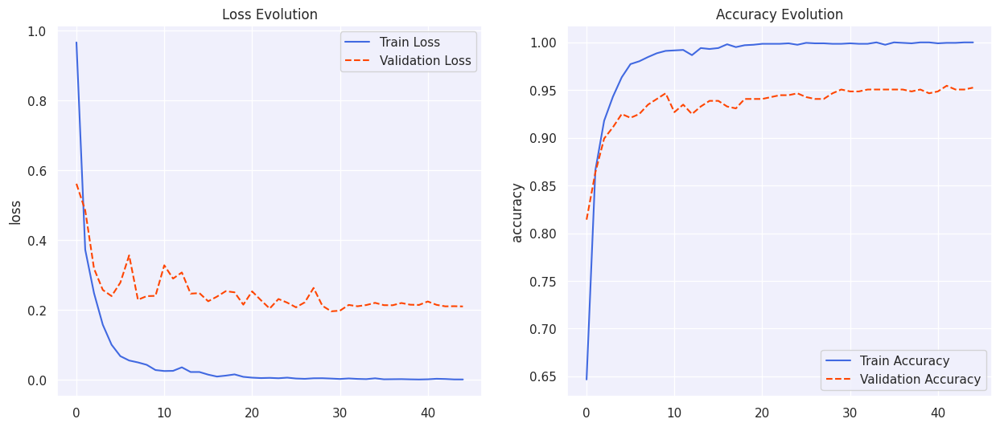

In [40]:
plot_learning_curves(history, start_epoch=1)

In [ ]:
evaluate_model_performance(transfer_resnet50_model, val_generator, class_labels)